## Importación de librerías

In [1]:
%matplotlib inline
import seaborn
import numpy as np, scipy, matplotlib.pyplot as plt, IPython.display as ipd, sklearn
import librosa, librosa.display
plt.rcParams['figure.figsize'] = (18, 5)

ModuleNotFoundError: No module named 'librosa'

## Carga de fragmento de señal para probar. Se escucha y se muestra normalizado

In [2]:
x, sr = librosa.load('../audios/Glotin 1.wav', duration=180)

In [3]:
ipd.Audio(x, rate=sr)

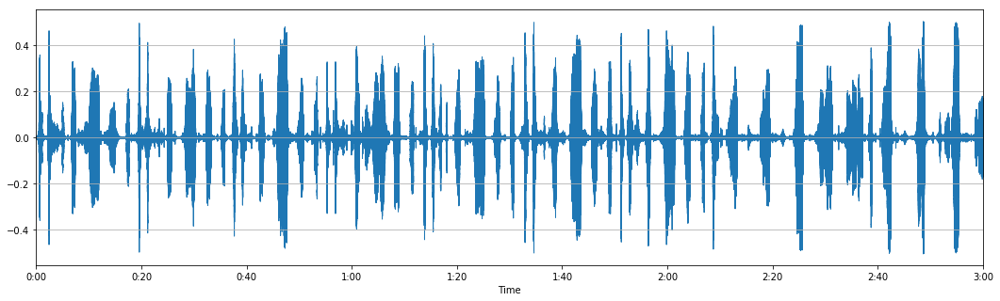

In [5]:
plt.rcParams['figure.figsize'] = (18, 5)
librosa.display.waveplot(x, sr=sr)
plt.grid(axis='y')

## Se establecen valores longitud de frame y de salto para cálculos

In [6]:
hop_length = 256
frame_length = 512

# Análisis temporal de la señal

Para poder fragmentar la señal de manera que se puedan separas los diferentes fragmentos de audio, en primer lugar se va a analizar la envolvente de la señal en el dominio temporal. Esto consiste en calcuar en que momentos el nivel de la señal está por deajo o por encima de un umbral que permita saber si hay sonido de interés o no.

### Cálculo de energía por el cuadrado de la energía

In [7]:
energy =np.array([
    sum(abs(x[i:i+frame_length]**2))
    for i in range(0, len(x), hop_length) 
])

### Cálculo de energía por RMSE

In [8]:
rmse = librosa.feature.rmse(x, hop_length=hop_length, frame_length=frame_length, center=True)
rmse = rmse[0]

### Conversión de frames a tiempo

In [9]:
frames = range(len(energy))
t = librosa.frames_to_time(frames, sr=sr, hop_length=hop_length)

### Comparación entre señales

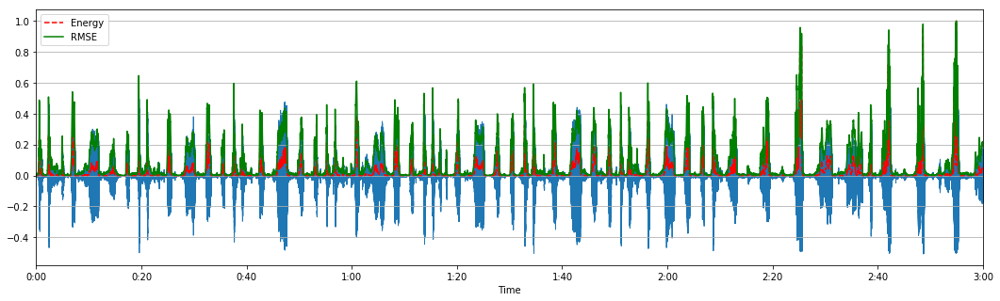

In [10]:
plt.rcParams['figure.figsize'] = (18, 5)
librosa.display.waveplot(x, sr=sr)
plt.plot(t, energy/energy.max(), 'r--')             # normalized for visualization
plt.plot(t, rmse/rmse.max(), color='g') # normalized for visualization
plt.grid(axis='y')
plt.legend(('Energy', 'RMSE'))

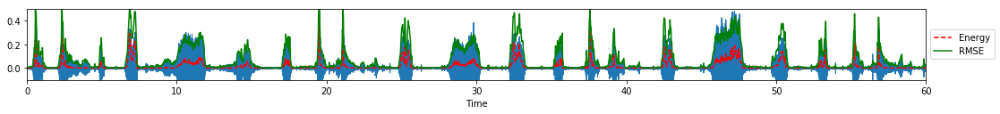

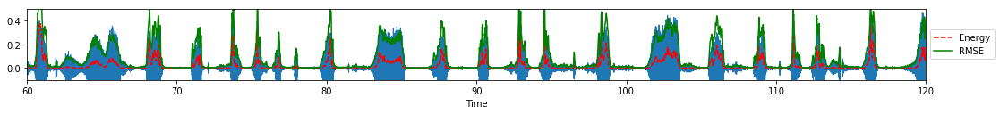

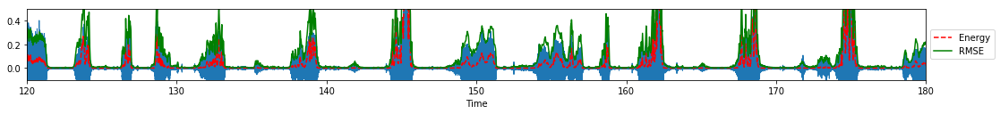

In [23]:
plt.figure()
plt.subplot(3, 1, 1)
librosa.display.waveplot(x, sr=sr)
plt.plot(t, energy/energy.max(), 'r--')
plt.plot(t[:len(energy)], rmse[:len(energy)]/rmse[:len(energy)].max(), color='g') # normalized for visualization
plt.xlim(0,60)
plt.ylim(-0.1, 0.5)
plt.legend(('Energy', 'RMSE'), loc='center left', bbox_to_anchor=(1, 0.5))


plt.figure()
plt.subplot(3, 1, 2)
librosa.display.waveplot(x, sr=sr)
plt.plot(t, energy/energy.max(), 'r--')         
plt.plot(t[:len(energy)], rmse[:len(energy)]/rmse[:len(energy)].max(), color='g') 
plt.xlim(60,120)
plt.ylim(-0.1, 0.5)
plt.xscale('linear')
plt.legend(('Energy', 'RMSE'), loc='center left', bbox_to_anchor=(1, 0.5))

plt.figure()
plt.subplot(3, 1, 3)
librosa.display.waveplot(x, sr=sr)
plt.plot(t, energy/energy.max(), 'r--')         
plt.plot(t[:len(energy)], rmse[:len(energy)]/rmse[:len(energy)].max(), color='g') 
plt.xlim(120,180)
plt.ylim(-0.1, 0.5)
plt.xscale('linear')
plt.legend(('Energy', 'RMSE'), loc='center left', bbox_to_anchor=(1, 0.5))

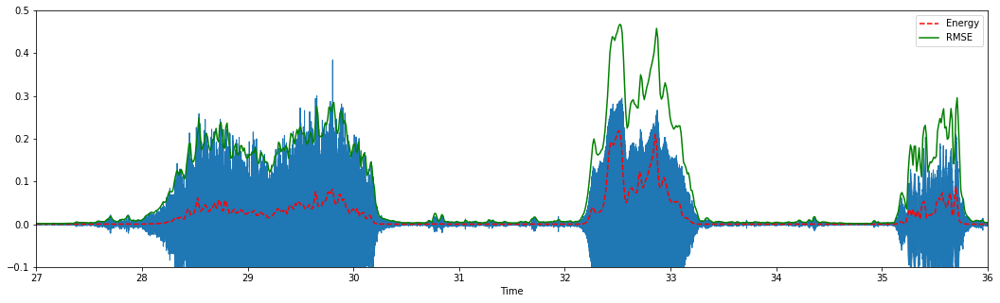

In [24]:
plt.rcParams['figure.figsize'] = (18, 5)
librosa.display.waveplot(x, sr=sr)
plt.plot(t, energy/energy.max(), 'r--')             # normalized for visualization
plt.plot(t[:len(energy)], rmse[:len(energy)]/rmse[:len(energy)].max(), color='g') # normalized for visualization
plt.xlim(27,36)
plt.ylim(-0.1, 0.5)
plt.legend(('Energy', 'RMSE'))

Aunque la forma espectral de ambas formas de energía es similar, en el caso de la RMSE da un mayor nivel, siendo más sencillo establecer límites de corte diferenciando donde hay señal y donde no.

### Se crea una función que calcule los números de muestra donde la señal pase de un lado a otro del umbral. Además se añade un script que haga que las señales sean de al menos medio segundo para ser guardadas

In [25]:
limite = 0.1   # Ahora ver en que punto el rmse sobrepasa un límite
frame = 0   # Índice de RMSE
onsets_frames = np.array([]).astype(int)
offsets_frames = np.array([]).astype(int)
    
while frame < len(rmse)-1:  # Iteracción por todo el RMSE cuando es menor que el límite 
    if rmse[frame] > limite:   # Al ser menor que el limite no se guarda
        if rmse[frame-1] < limite:
            onsets_frames = np.append(onsets_frames, frame)
        
    if rmse[frame] < limite:
        if rmse[frame-1] > limite:
            offsets_frames = np.append(offsets_frames, frame)
            
    frame += 1

if onsets_frames[0] > offsets_frames[0]:
    onsets_frames = numpy.delete(onsets_frames, onsets_frames[0])
    
if len(onsets_frames) > len(offsets_frames):
    onsets_frames = numpy.delete(onsets_frames, onsets_frames[-1])

onsets_samples = librosa.frames_to_samples(onsets_frames, hop_length=hop_length)
offsets_samples = librosa.frames_to_samples(offsets_frames, hop_length=hop_length)

onsets = np.array([]).astype(int)
offsets = np.array([]).astype(int)
for on,off in zip(onsets_samples,offsets_samples): 
    if off - on > int(0.5*sr):
        onsets = np.append(onsets, on)
        offsets = np.append(offsets, off)


In [26]:
onsets, offsets

(array([1034752, 2260992, 3196928]), array([1049856, 2280960, 3210752]))

In [27]:
ipd.Audio(x[1034752:1049856], rate=sr)

Salen muy pocas muestras. Hay que mejorar script y mirar otras posibles features a analizar.

Otra opción son los cruces por cero. Se puede observar cuantos cruces hay dentro de cada frame y comparar con anteriores y posteriores. Si el numero de cruces es similar, tendrán la misma frecuencia y se puede entender como que es el mismo sonido.

### Selección de fragmento de prueba para cruces por cero

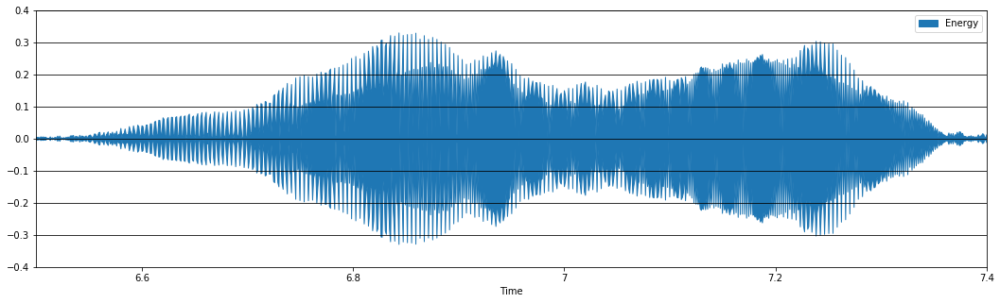

In [28]:
plt.rcParams['figure.figsize'] = (18, 5)
librosa.display.waveplot(x, sr=sr)
#plt.plot(t[:len(energy)], rmse[:len(energy)]/rmse[:len(energy)].max(), color='g') 
plt.xlim(6.5,7.4)
plt.ylim(-0.4, 0.4)
plt.grid(axis='y', color='k')
plt.legend(('Energy', 'RMSE'))

In [29]:
ipd.Audio(x[int(6.5*sr):int(7.5*sr)], rate=sr)

In [30]:
x_zero = x[int(6.5*sr):int(7.5*sr)]
zero_cross = librosa.zero_crossings(x_zero, pad = False)
zero_cross

array([False, False, False, ..., False, False, False])

In [31]:
zeros = []
z = 0
while z < len(zero_cross-1):
    muestras = 0
    zero = []
    while muestras < frame_length-1 and z < len(zero_cross-1):
        zero.append(zero_cross[z])
        z += 1
        muestras += 1       
    zeros.append(zero)
    if z < len(zero_cross-1):
        z -= hop_length

In [33]:
cruces = []
for zero in zeros:
    cruces.append(sum(zero))
len(cruces), np.mean(cruces), cruces

(86,
 30.023255813953487,
 [60,
  59,
  46,
  30,
  31,
  27,
  27,
  25,
  23,
  23,
  23,
  23,
  24,
  23,
  17,
  15,
  21,
  23,
  22,
  23,
  23,
  23,
  23,
  22,
  22,
  23,
  23,
  23,
  23,
  23,
  23,
  23,
  23,
  23,
  24,
  23,
  23,
  24,
  24,
  24,
  24,
  24,
  24,
  24,
  24,
  24,
  25,
  25,
  24,
  24,
  24,
  24,
  24,
  24,
  25,
  25,
  24,
  24,
  23,
  23,
  24,
  24,
  24,
  23,
  23,
  24,
  24,
  24,
  23,
  23,
  24,
  24,
  27,
  38,
  50,
  71,
  82,
  57,
  41,
  55,
  66,
  58,
  63,
  63,
  62,
  56])

Aquí se puede ver como la mayor parte de cruces por cero en bloques de seal está entre 23 y 25

# Análisis en el dominio de la frecuencia

En ese caso se va a tener en cuenta cual es la forma del espectro de la señal para establecer un patrón que indique que si la señal se mantiene con la misma forma espectral.

### Se hace la TFT de la señal, se halla su valor absoluto y se pasa la amplitud a decibelios

In [34]:
X = librosa.stft(x)
X_mag = librosa.amplitude_to_db(abs(X))

### Espectrograma de la señal

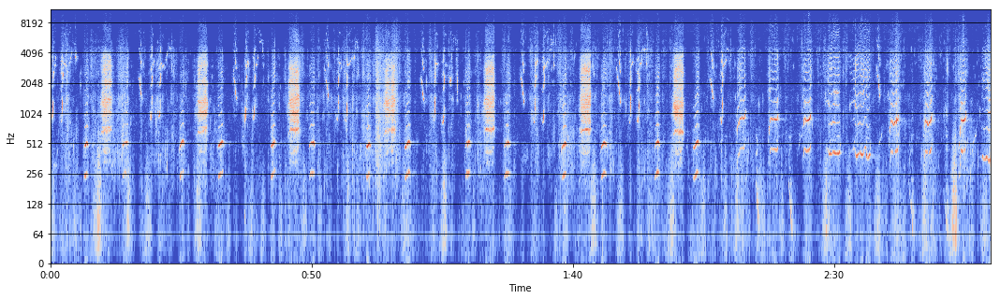

In [35]:
librosa.display.specshow(X_mag, sr=sr, x_axis='time', y_axis='log')
plt.grid(axis='y', color='k')

### Comparación de señal en el dominio del tiempo con la señal en el dominio de la frecuencia

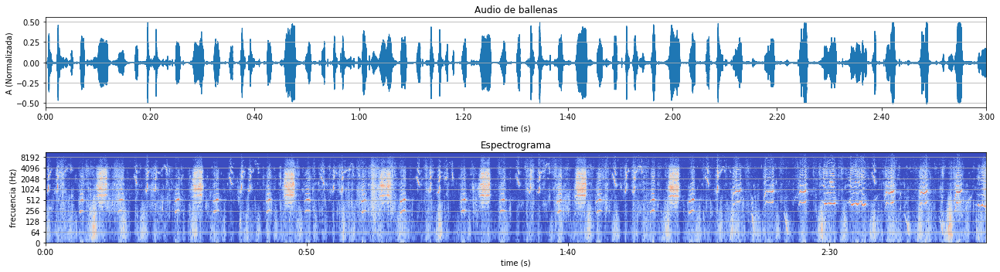

In [36]:
plt.subplot(2, 1, 1)
plt.rcParams['figure.figsize'] = (15, 5)
librosa.display.waveplot(x, sr=sr)

plt.xlabel('time (s)')
plt.ylabel('A (Normalizada)')
plt.grid(axis='y')
plt.title('Audio de ballenas')

plt.subplot(2, 1, 2)
plt.rcParams['figure.figsize'] = (15, 5)
librosa.display.specshow(X_mag, sr=sr, x_axis='time', y_axis='log')
plt.grid(axis='y')
plt.title('Espectrograma')

plt.xlabel('time (s)')
plt.ylabel('frecuencia (Hz)')

plt.tight_layout()

In [38]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape

(7752,)

In [44]:
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

In [45]:
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

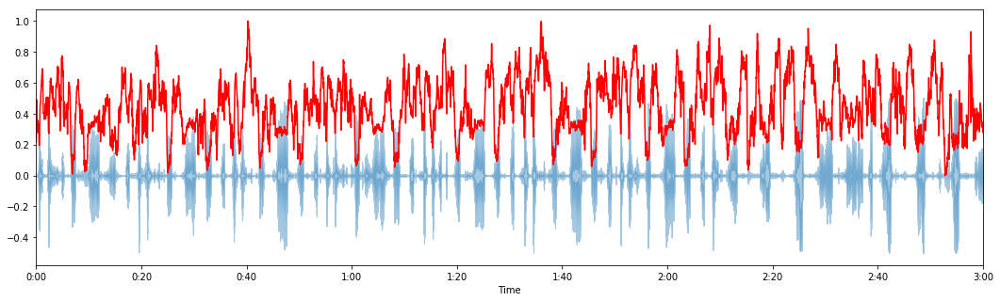

In [51]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

(0, 20)

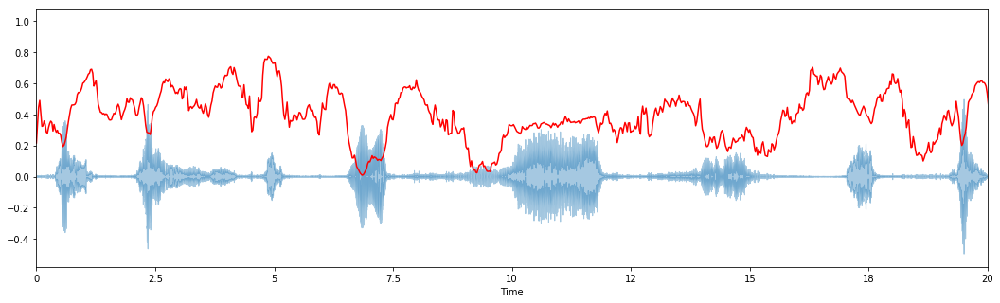

In [48]:
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')
plt.xlim(0,20)

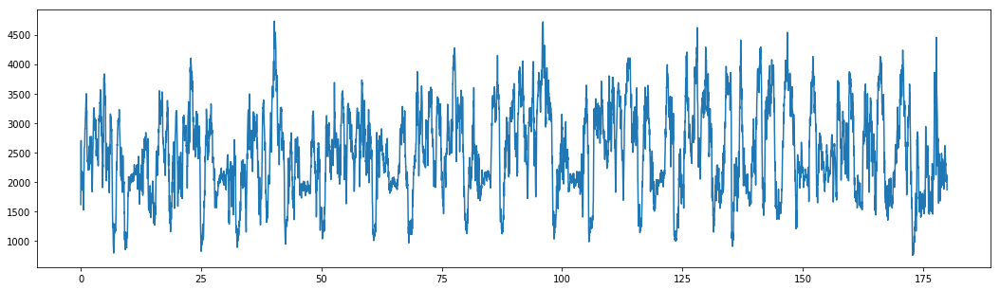

In [52]:
plt.plot(t, spectral_centroids)